<a href="https://colab.research.google.com/github/tsugg/LOCO-YOLOv8/blob/main/LOCO_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Install Dependencies

### Ultralytics
These are the creators of YOLOv8. We use the YOLOv8 train, test, validation, and config template. We call their functions for training and prediction.

https://github.com/ultralytics/ultralytics

### ByteTrack
This package is used for object tracking. They are the lowest latency for multi object tracking.

https://github.com/ifzhang/ByteTrack

### Supervision
This package allows us to bring together ultralytics and ByteTrack with some simple functions to draw detections, labels, and count objects in polygon zones. Supervision is run by Roboflow. I used Roboflow as an annotation tool, to train some models, and even an API to host my models.

https://github.com/roboflow/supervision

https://roboflow.com/

In [ ]:
## Ultralytics
!pip install -q ultralytics

## ByteTrack install
!pip install -q loguru thop lap ninja
!git clone https://github.com/ifzhang/ByteTrack.git
!cd ByteTrack && sed -i 's/onnx==1.8.1/onnx==1.9.0/g' requirements.txt 
!cd ByteTrack && pip3 install -q -r requirements.txt
!cd ByteTrack && python3 setup.py -q develop

## Other packages supervision==0.3.1
!pip install -q --upgrade --no-cache-dir gdown
!pip install -q cython_bbox onemetric supervision==0.5.2 roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.0/527.0 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 41.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 16.9 MB/s eta 0:00:00
Cloning into 'ByteTrack'...
remote: Enumerating objects: 2007, done.
remote: Total 2007 (delta 0), reused 0 (delta 0), pack-reused 2007
Receiving objects: 100% (2007/2007), 79.60 MiB | 17.01 MiB/s, done.
Resolving deltas: 100% (1141/1141), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 16.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 93.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from dataclasses import dataclass
import logging
import tqdm
import sys
import os

HOME = os.getcwd()
sys.path.append(f"{HOME}/ByteTrack")

import matplotlib.pyplot as plt
from roboflow import Roboflow
from typing import List
import numpy as np
import supervision
import ultralytics
import yolox
import cv2

os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

from yolox.tracker.byte_tracker import BYTETracker, STrack
from onemetric.cv.utils.iou import box_iou_batch
from ultralytics import YOLO
from IPython import display

display.clear_output()
ultralytics.checks()

print("yolox.__version__:", yolox.__version__)

%matplotlib inline

Ultralytics YOLOv8.0.82 🚀 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.5/78.2 GB disk)


yolox.__version__: 0.1.0


## Logistics Objects in Context (LOCO) Dataset

There's a free to use dataset I found on github that has object detection labels for forklifts, pallets, pallet trucks, and more.

This dataset was labeled using COCO format. To save myself time and effort, I used Roboflow as a way to convert the annotations from COCO to YOLOv8 format. I hosted my dataset in their 'Universe' and I even trained a model using one of my 3 free credits.

https://github.com/tum-fml/loco


https://universe.roboflow.com/tommy-sugg-uhvch/logistics-objects-in-context/dataset/1

LOCO: Logistics Objects in Context
Mayershofer, C., Holm, D.-M., Molter, B., Fottner, J.
IEEE International Conference on Machine Learning and Applications (ICMLA) 2020

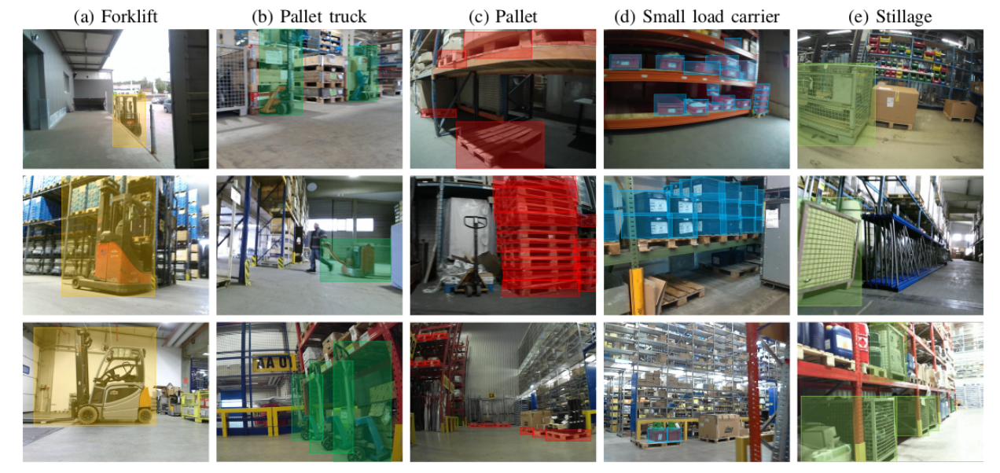


## Download files from Tommy's Google Drive

I have 2 different videos we are going to use for this demo. I also have a model.pt file containing the weights for a model I trained locally.

In [ ]:
!gdown 1Tm3d8mzpL4TAnPSLNsKCDyfvwL91Gx6t
!gdown 1_qMnyb6qyOa2hqCxS4V7UjsE2KbgrqB5
!gdown 1Ks22y6r4ADfBXwFAydUjgA8J__KL74aj

Downloading...
From: https://drive.google.com/uc?id=1Tm3d8mzpL4TAnPSLNsKCDyfvwL91Gx6t
To: /content/forklift_aisle.mp4
100% 4.34M/4.34M [00:00<00:00, 279MB/s]
Downloading...
From: https://drive.google.com/uc?id=1_qMnyb6qyOa2hqCxS4V7UjsE2KbgrqB5
To: /content/forklift-training.mp4
100% 26.9M/26.9M [00:00<00:00, 247MB/s]
Downloading...
From (uriginal): https://drive.google.com/uc?id=1Ks22y6r4ADfBXwFAydUjgA8J__KL74aj
From (redirected): https://drive.google.com/uc?id=1Ks22y6r4ADfBXwFAydUjgA8J__KL74aj&confirm=t&uuid=58e0692d-c9ba-4f25-8225-84d6a72a0292
To: /content/best.pt
100% 137M/137M [00:00<00:00, 192MB/s]


## Access my LOCO model from roboflow.com via API Key

If you let Roboflow train a model for you, there are a bunch of ways you can access it. You can download a .zip, use a curl command, download a Docker image, or use an API key like I do below.

https://universe.roboflow.com/tommy-sugg-uhvch/logistics-objects-in-context

In [ ]:
rf = Roboflow(api_key="31VX6QPkOv8zgpPVSVrs")
project = rf.workspace("tommy-sugg-uhvch").project("logistics-objects-in-context")
model = project.version(1).model

loading Roboflow workspace...
loading Roboflow project...


## Simple prediction on the first frame of the video

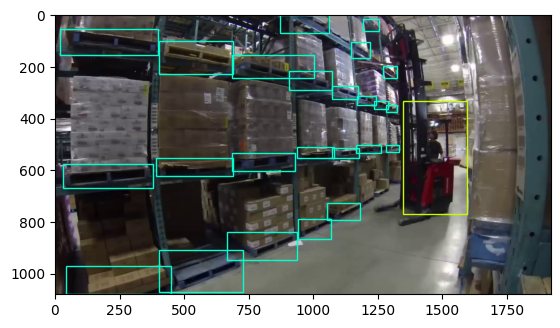

In [ ]:
SOURCE_VIDEO_PATH = "forklift-training.mp4"

generator = supervision.get_video_frames_generator(SOURCE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

cv2.imwrite("forklift-training.png", frame)

prediction = model.predict("forklift-training.png", confidence=25, overlap=47)
prediction.plot()
prediction.save("forklift-training-out.png")

## Using local .pt file and performing object tracking with ByteTrack

In [59]:
HOME = os.getcwd()
SOURCE_VIDEO_PATH = f"{HOME}/forklift-training.mp4"
TARGET_VIDEO_PATH = f"{HOME}/forklift-training-out.mp4"
MODEL = f"{HOME}/best.pt"

In [60]:
# model = YOLO(MODEL)
model = YOLO(MODEL)
model.fuse()
CLASS_NAMES_DICT = model.model.names
print(CLASS_NAMES_DICT)

Model summary (fused): 268 layers, 68128383 parameters, 0 gradients, 257.4 GFLOPs


{0: 'forklift', 1: 'pallet', 2: 'pallet_truck', 3: 'small_load_carrier', 4: 'stillage'}


In [61]:
@dataclass(frozen=True)
class BYTETrackerArgs:
    track_thresh: float = 0.25
    track_buffer: int = 30
    match_thresh: float = 0.8
    aspect_ratio_thresh: float = 3.0
    min_box_area: float = 1.0
    mot20: bool = False

# converts Detections into format that can be consumed by match_detections_with_tracks function
def detections2boxes(detections: supervision.Detections) -> np.ndarray:
    return np.hstack((
        detections.xyxy,
        detections.confidence[:, np.newaxis]
    ))


# converts List[STrack] into format that can be consumed by match_detections_with_tracks function
def tracks2boxes(tracks: List[STrack]) -> np.ndarray:
    return np.array([
        track.tlbr
        for track
        in tracks
    ], dtype=float)


# matches our bounding boxes with predictions
def match_detections_with_tracks(detections: supervision.Detections, tracks: List[STrack]) -> supervision.Detections:
    if not np.any(detections.xyxy) or len(tracks) == 0:
        return np.empty((0,))

    tracks_boxes = tracks2boxes(tracks=tracks)
    iou = box_iou_batch(tracks_boxes, detections.xyxy)
    track2detection = np.argmax(iou, axis=1)
    
    tracker_ids = [None] * len(detections)
    
    for tracker_index, detection_index in enumerate(track2detection):
        if iou[tracker_index, detection_index] != 0:
            tracker_ids[detection_index] = tracks[tracker_index].track_id

    return tracker_ids

In [62]:
byte_tracker = BYTETracker(BYTETrackerArgs())
video_info = supervision.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
generator = supervision.get_video_frames_generator(SOURCE_VIDEO_PATH)

box_annotator = supervision.BoxAnnotator(
    thickness=2, 
    text_thickness=1, 
    text_scale=.5
)

In [ ]:
with supervision.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
  for frame in generator:
    try:
      results = model(frame)[0]

      detections = supervision.Detections(
          xyxy=results.boxes.xyxy.cpu().numpy(),
          confidence=results.boxes.conf.cpu().numpy(),
          class_id=results.boxes.cls.cpu().numpy().astype(int)
      )

      detections = detections[(detections.confidence > .3)]


      tracks = byte_tracker.update(
          output_results=detections2boxes(detections=detections),
          img_info=frame.shape,
          img_size=frame.shape
      )

      tracker_id = match_detections_with_tracks(
          detections=detections, tracks=tracks
      )

      detections.tracker_id = np.array(tracker_id)

      labels = [
          f"#{tracker_id} {CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
          for _, _, confidence, class_id, tracker_id in detections
      ]

      frame = box_annotator.annotate(
          scene=frame,
          detections=detections,
          labels=labels
      )
    except:
      pass
    sink.write_frame(frame)

In [64]:
from IPython.display import HTML
from base64 import b64encode

# Compressed video path
COMPRESSED_PATH = f"{HOME}/forklift-training-out-compressed.mp4"

os.system(f"ffmpeg -i {TARGET_VIDEO_PATH} -vcodec libx264 {COMPRESSED_PATH}")

# Show video
mp4 = open(COMPRESSED_PATH,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Object tracking and counting in zones using Supervision and ByteTrack

Instead of using one of my models this time, let's just download one of the models available from ultralytics trained on COCO dataset.



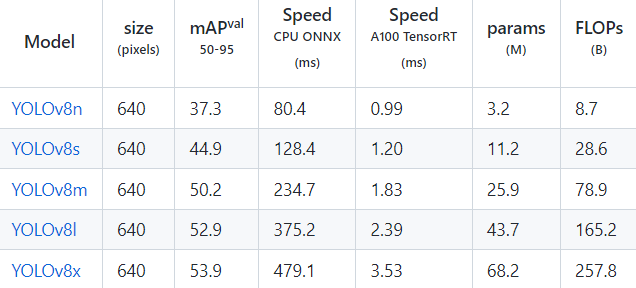

In [65]:
HOME = os.getcwd()
print(HOME)
SOURCE_VIDEO_PATH = f"{HOME}/forklift_aisle.mp4"
TARGET_VIDEO_PATH = f"{HOME}/forklift_aisle_out.mp4"

model = YOLO('yolov8x.pt')
model.fuse()
CLASS_NAMES_DICT = model.model.names
print(CLASS_NAMES_DICT)

/content


YOLOv8x summary (fused): 268 layers, 68200608 parameters, 0 gradients, 257.8 GFLOPs


{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [66]:
colors = supervision.ColorPalette.default()
video_info = supervision.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

byte_tracker = BYTETracker(BYTETrackerArgs())
generator = supervision.get_video_frames_generator(SOURCE_VIDEO_PATH)

In [67]:
polygons = [
    np.array([
        [468 , 397],
        [612 , 394],
        [815 , video_info.resolution_wh[1]],
        [242 , video_info.resolution_wh[1]]
    ], np.int32)
]

zones = [
    supervision.PolygonZone(
        polygon=polygon, 
        frame_resolution_wh=video_info.resolution_wh
    )
    for polygon
    in polygons
]

zone_annotators = [
    supervision.PolygonZoneAnnotator(
        zone=zone, 
        color=colors.by_idx(index), 
        thickness=4,
        text_thickness=4,
        text_scale=2
    )
    for index, zone
    in enumerate(zones)
]

box_annotators = [
    supervision.BoxAnnotator(
        color=colors.by_idx(index), 
        thickness=2, 
        text_thickness=2, 
        text_scale=1
        )
    for index
    in range(len(polygons))
]

In [ ]:
with supervision.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
  for frame in generator:
    try:
      results = model(frame)[0]

      detections = supervision.Detections(
          xyxy=results.boxes.xyxy.cpu().numpy(),
          confidence=results.boxes.conf.cpu().numpy(),
          class_id=results.boxes.cls.cpu().numpy().astype(int)
      )

      detections = detections[(detections.confidence > .7) & (detections.class_id == 0)]

      tracks = byte_tracker.update(
          output_results=detections2boxes(detections=detections),
          img_info=frame.shape,
          img_size=frame.shape
      )

      tracker_id = match_detections_with_tracks(
          detections=detections, tracks=tracks
      )

      detections.tracker_id = np.array(tracker_id)

      labels = [
          f"#{tracker_id} {CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
          for _, _, confidence, class_id, tracker_id in detections
      ]

      frame = box_annotator.annotate(
          scene=frame,
          detections=detections,
          labels=labels
      )

      for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
        mask = zone.trigger(detections=detections)
        detections = detections[mask]
        frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
        frame = zone_annotator.annotate(scene=frame)
        
    except:
      pass
    sink.write_frame(frame)

## This is a different method to track not using ByteTrack. I find that it works very poorly

In [ ]:
# def process_frame(frame: np.ndarray, i) -> np.ndarray:
#     print(i)

#     results = model(frame)[0]
#     detections = supervision.Detections.from_yolov8(results)

#     if results.boxes.id is not None:
#         detections.tracker_id = results.boxes.id.cpu().numpy().astype(int)

#     detections = detections[(detections.confidence > .7) & (detections.class_id == 0)]
#     #{tracker_id} 
#     labels = np.asarray([
#         f"{model.model.names[class_id]} {confidence:0.2f}"
#         for _, confidence, class_id, _ in detections
#     ])
    
#     for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
#         mask = zone.trigger(detections=detections)
#         detections = detections[mask]
#         frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
#         frame = zone_annotator.annotate(scene=frame)
#     return frame

In [ ]:
# supervision.process_video(source_path=SOURCE_VIDEO_PATH, target_path=TARGET_VIDEO_PATH, callback=process_frame)

In [69]:
from IPython.display import HTML
from base64 import b64encode

# Compressed video path
COMPRESSED_PATH = f"{HOME}/forklift_aisle_out_compressed.mp4"

os.system(f"ffmpeg -i {TARGET_VIDEO_PATH} -vcodec libx264 {COMPRESSED_PATH}")

# Show video
mp4 = open(COMPRESSED_PATH,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)


0: 480x640 1 person, 1 bird, 73.3ms
Speed: 0.5ms preprocess, 73.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


True

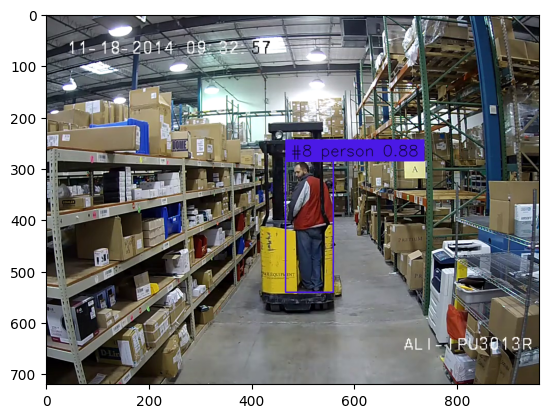

In [ ]:
generator = supervision.get_video_frames_generator(SOURCE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

box_annotator = supervision.BoxAnnotator(
    thickness=2, 
    text_thickness=1, 
    text_scale=1
)

for i in range(400):
  frame = next(iterator)

frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
results = model(frame)[0]

detections = supervision.Detections(
    xyxy=results.boxes.xyxy.cpu().numpy(),
    confidence=results.boxes.conf.cpu().numpy(),
    class_id=results.boxes.cls.cpu().numpy().astype(int)
)

detections = detections[(detections.confidence > .7)]

tracks = byte_tracker.update(
    output_results=detections2boxes(detections=detections),
    img_info=frame.shape,
    img_size=frame.shape
)

tracker_id = match_detections_with_tracks(
    detections=detections, tracks=tracks
)

detections.tracker_id = np.array(tracker_id)

labels = [
    f"#{tracker_id} {CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, tracker_id in detections
]

frame = box_annotator.annotate(
    scene=frame,
    detections=detections,
    labels=labels
)
plt.imshow(frame)
cv2.imwrite("forklift_aisle_out.png", frame)

### SAM (Segment anything model)

Trained on 11 million images and 1 billion masks. Segment anything in an image or in a specific region 

https://github.com/facebookresearch/segment-anything

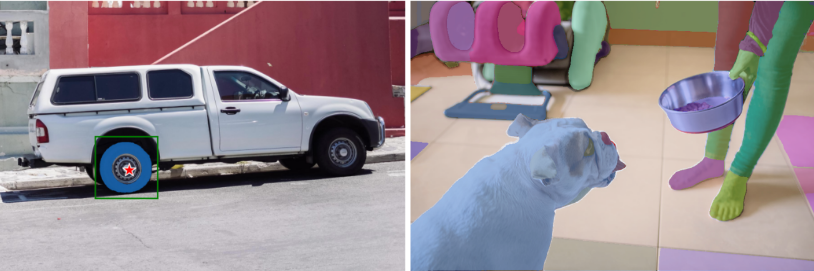

In [ ]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import torch

!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

!mkdir {HOME}/weights
%cd {HOME}/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-xq0w1q0g
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-xq0w1q0g
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 567662b0fd33ca4b022d94d3b8de896628cd32dd
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36610 sha256=ae1ceac7bf5657ec2d8420c25e8d114cc7c1cc35d2154705509c3a00d4bee647
  Stored in directory: /tmp/pip-ephem-wheel-cache-6jq4hwby/wheels/d5/11/03/7aca746a2c0e09f279b10436ced7175926bc38f650b736a648
Successfully built segment-anything


In [ ]:
CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")

MODEL_TYPE = "vit_h"
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)
mask_predictor = SamPredictor(sam)

### Using detections from YOLO, predict using SAM to segment

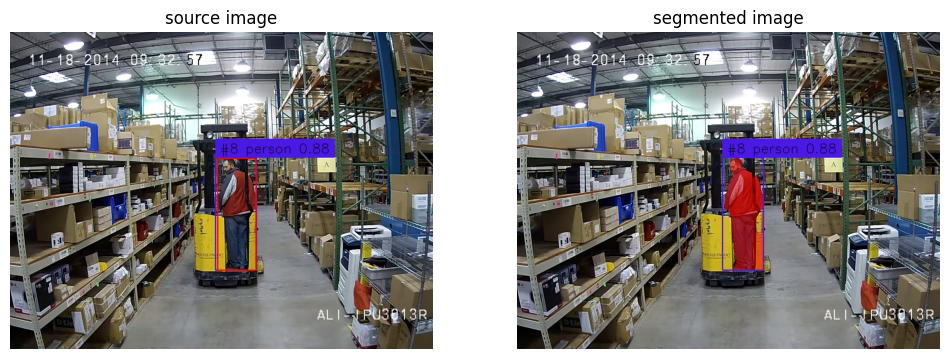

In [ ]:
image_bgr = cv2.imread("forklift_aisle_out.png")
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

mask_predictor.set_image(image_rgb)
masks, scores, logits = mask_predictor.predict(
    box=detections.xyxy,
    multimask_output=True
)

box_annotator = supervision.BoxAnnotator(color=supervision.Color.red())
mask_annotator = supervision.MaskAnnotator(color=supervision.Color.red())

detections = supervision.Detections(
    xyxy=supervision.mask_to_xyxy(masks=masks),
    mask=masks
)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_rgb.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

supervision.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)